# Вводная информация об объекте исследования
Вы будете работать с данными, которые собираются с самосвалов, перевозящих породу (например, уголь) на карьере. На самосвалах стоят датчики, которые собирают множество различной информации (скорость, высота, расход топлива и тд). Данные с каждого датчика приходят вместе с временной меткой, идентификатором самосвала и его местоположением (координатами) в момент получения значения с датчика.

Сам по себе карьер состоит из пунктов погрузки (откуда вывозят породу), пунктов разгрузки (куда её отвозят) и маршрутов между ними. На картинке показан пример исходных данных координат самосвалов (синие точки) и примерных дорог на карьере (фиолетовые). Пункты погрузки и разгрузки на картинке не указаны.

Одним рейсом самосвала называется его движение от пункта погрузки до пункта разгрузки и обратно до пункта погрузки.

![](https://drive.google.com/uc?export=view&id=1QLscdUpjOGU8m9WvN8ulKdC9YBWJyKw4)

## Данные:

**telemetry.parquet** - данные телеметрии
* objectid - идентификатор самосвала
* tripid - идентификатор рейса
* driverid - идентификатор водителя
* time - время получения данных с датчиков
* lat, lon - широта и долгота самосвала в текущий момент времени
* x, y, - координаты самосвала на плоскости (https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system)
* speed - данные с датчика скорости
* height - высота в текущий момент времени
* engine_speed - обороты двигателя
* fuel_cons - мгновенный расход топлива
* fuel_tank_level - уровень топлива в баке (в процентах)
* weight_dynamic - мгновенное значение веса с датчика (растет, пока самосвал грузит, колеблется вокруг константы, когда едет загруженный и обнуляется при разгрузке и движении без груза обратно на погрузку)
* weight - значение веса груза, который перевез самосвал за текущий рейс (константа для каждого рейса. Даже на той части рейса, где самосвал ехал пустым обратно на погрузку значение этого параметра будет равно весу груза)
* DQ_vertical_bump - вертикальное ускорения
* accelerator_position - позиция педали газа
* w_fl - ?

Пропуски в колонках fuel_tank_level и weight_dynamic обусловлены тем, что эти датчики собираются с меньшей дискретностью (условно, раз в 10 секунд, а не раз в секунду). При необходимости, можно восполнить Nan значения последним определенным значением (т.е. [1, 2, nan, 3, nan, 4, ...] -> [1, 2, 2, 3, 3, 4, ...])

**weather_hourly.parquet** - почасовая погода на карьере. Значения колонок понятны из их названий.

## Задание 1

* Отобразить на графике все местоположения самосвалов из исходных данных (предварительно убрав очевидные выбросы по координатам) = карта карьера (пока некорректная из-за ещё некоторых проблем с координатами)
* Обнаружить самосвал(ы), для которых всё ещё есть проблемы с координатами (обозначить их идентификаторы)
* Понять, по какому параметру можно избавиться от этих выбросов по координатам, и сделать чистку
* Нарисовать корректную карту карьера (если удалость определить, как сделать чистку)
* При необходимости, произвести чистку по другим колонкам (препроцессинг для дальнейшего обучения модели)
* Предположить, что обозначают значения колонки w_fl (путем анализа имеющихся данных) - ответ написать в текстовом поле и обосновать

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import datetime

In [5]:
telemetry = pd.read_parquet(r"C:\Users\Admin\Downloads\telemetry (1).parquet")


In [6]:
telemetry.head()

,objectid,time,lat,lon,speed,height,fuel_cons,engine_speed,hdop,DQ_vertical_bump,accelerator_position,fuel_tank_level,weight_dynamic,tripid,weight,driverid,w_fl,x,y
0,1121,2023-11-08 05:31:31.309000+07:00,63.328824,83.727988,3.00394,195.7,390.00,NaN,99.99,0,0,60.0,216.0,1003671.0,215.0,2891.0,1,636592.202274,7.025133e+06
1,1125,2023-11-08 03:21:39+07:00,63.334962,83.751046,0.00000,280.0,0.00,0.000,8.00,0,0,NaN,NaN,1003657.0,216.0,2887.0,0,637716.857273,7.025866e+06
2,1124,2023-11-08 19:20:55+07:00,63.343592,83.739678,4.20000,228.0,66.85,778.000,5.00,0,0,NaN,NaN,1003798.0,217.0,2875.0,0,637106.943106,7.026803e+06
3,1124,2023-11-08 14:16:39+07:00,63.343290,83.751773,16.80000,278.0,2.45,743.375,6.00,0,0,NaN,NaN,1003749.0,209.0,2875.0,0,637713.403209,7.026795e+06
4,1121,2023-11-08 11:09:49.347000+07:00,63.331924,83.765388,0.00000,70.9,17.00,NaN,99.99,0,0,38.0,0.0,1003728.0,204.0,2894.0,0,638449.084136,7.025559e+06


In [7]:
telemetry = telemetry.sort_values('time')

<Axes: xlabel='x', ylabel='Count'>

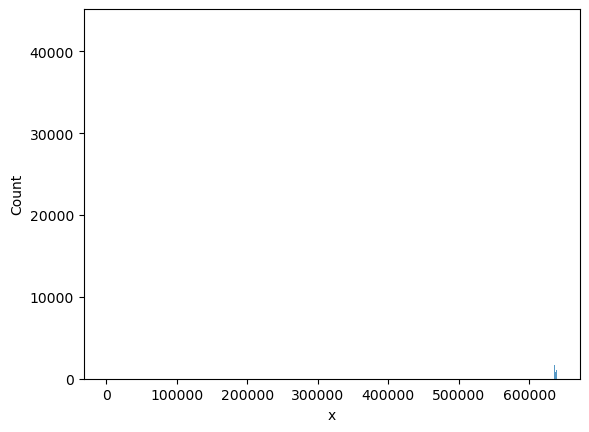

In [8]:
sns.histplot(telemetry.x)

In [9]:
telemetry = telemetry[telemetry.x > 0]


<Axes: xlabel='x', ylabel='Count'>

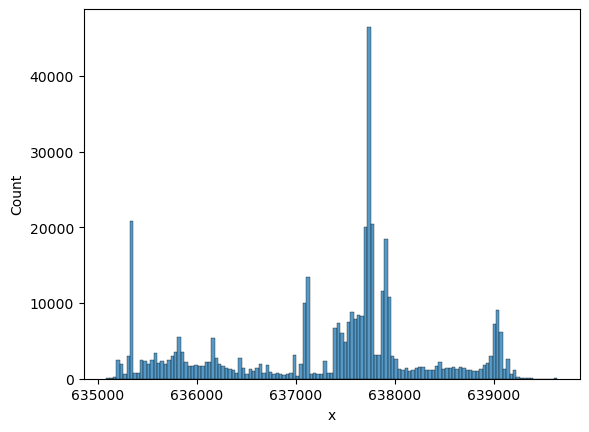

In [10]:
sns.histplot(telemetry.x)

<Axes: xlabel='lon', ylabel='Count'>

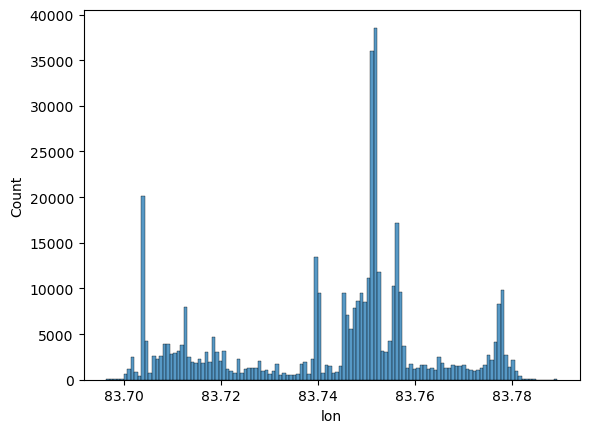

In [11]:
sns.histplot(telemetry.lon)

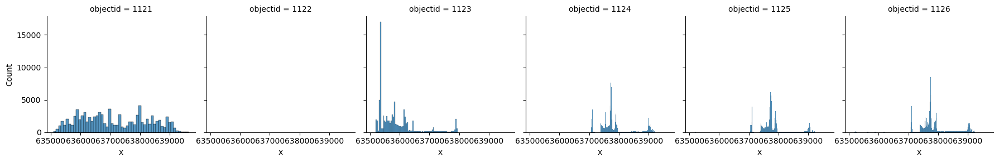

In [12]:
g = sns.FacetGrid(telemetry, col = 'objectid')
g.map(sns.histplot, 'x')

<Axes: xlabel='y', ylabel='Count'>

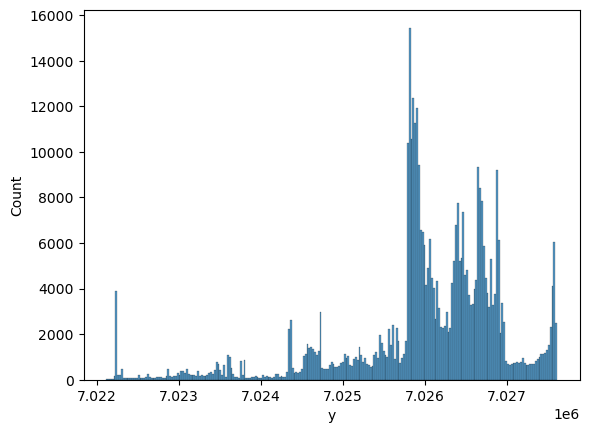

In [13]:
sns.histplot(telemetry.y)

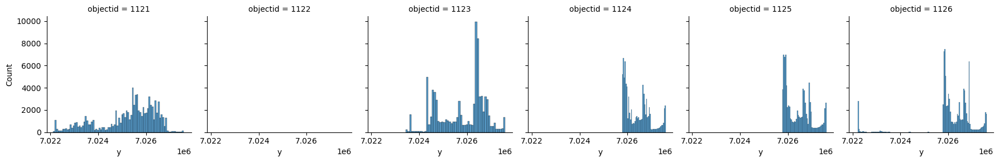

In [14]:
g = sns.FacetGrid(telemetry, col = 'objectid')
g.map(sns.histplot, 'y')

<Axes: xlabel='x', ylabel='y'>

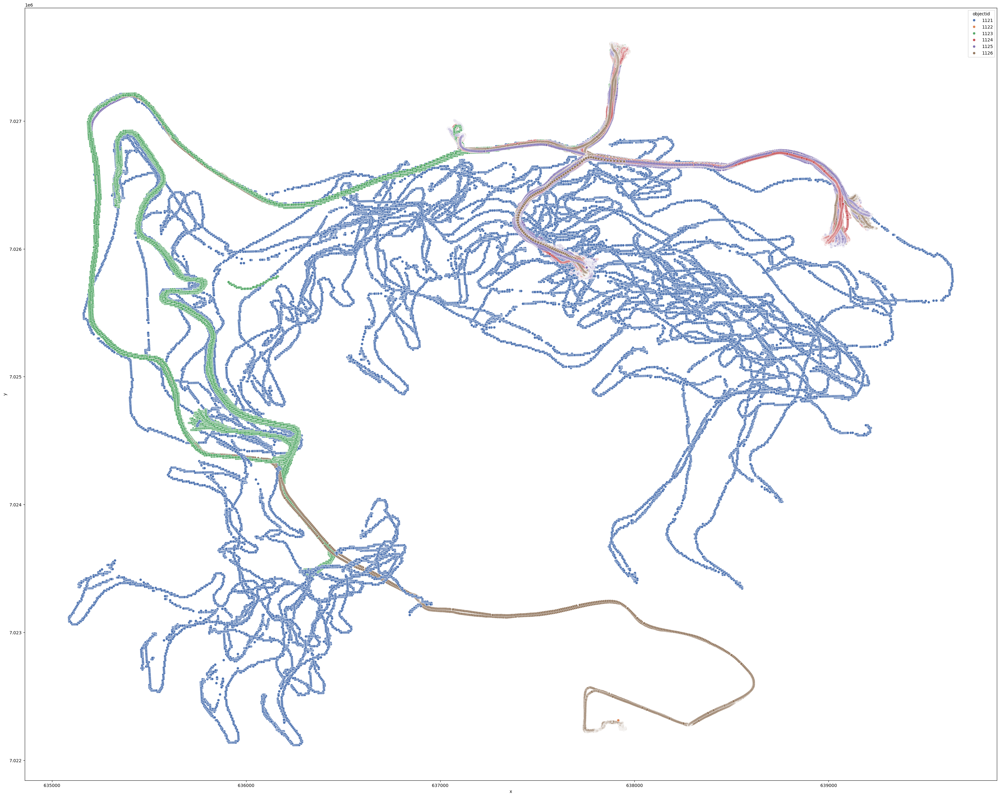

In [15]:
plt.figure(figsize=(40, 32))  
sns.scatterplot(telemetry, x = "x", y = "y", hue = 'objectid',palette="deep")

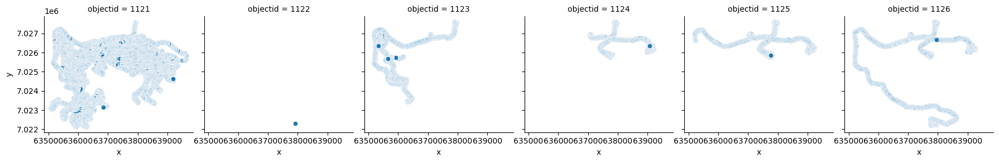

In [16]:
g = sns.FacetGrid(telemetry, col = 'objectid')
g.map(sns.scatterplot, 'x','y')

<Axes: xlabel='x', ylabel='y'>

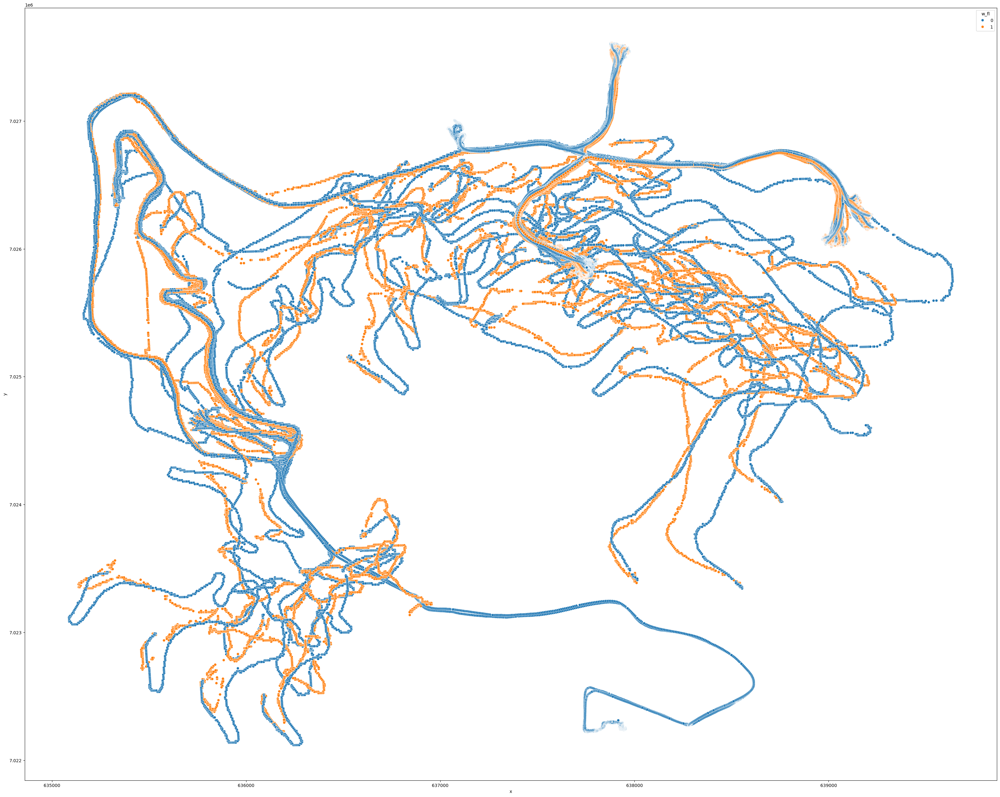

In [17]:
plt.figure(figsize=(40, 32))  
sns.scatterplot(telemetry,x='x',y='y', hue = 'w_fl')

Мне кажется, что параметр 'w_fl' является флагом наличия груза у самосвала т.к. траектории передвижения самосвалов с разными значениями похожи, также этот параметр принимает всего два значения, я предположил, что это флаг.

Легко заметить, что самосвал с индентификатором 1122 передал всего одну уникальную координату за все время, значит он не менял своего положения с течением времени. Маршрут самосвала с objectid 1121 очень странный: он содержит в себе отдельные кусочные отрезки, видно что иногда самосвал как-будто делал скачки, "срезал" участки маршрута. В маршрутах других самосвалов подобных аномалий замечено не было, их маршруты часто пересекаются, что приводит к наложению точек. Пока другие самосвалы возвращаются одним и тем же маршрутом, самосвал 1121 почти всегда выбирает разные пути.

Далее я пытался делать фильтрацию через среднее квадратичное отклонение, но у меня не получилось.

In [21]:
telemetry[(telemetry.objectid != 1122)]
X_var = telemetry[(telemetry.objectid != 1121)].x.var()
Y_var = telemetry[(telemetry.objectid != 1121)].y.var()
telemetry_prob = telemetry[telemetry.objectid == 1121]

In [22]:
coor = []
for i in range(telemetry_prob.x.shape[0]-1):
    r_x = abs(telemetry_prob.x.iloc[i] - telemetry_prob.x.iloc[i+1])
    r_y = abs(telemetry_prob.y.iloc[i] - telemetry_prob.y.iloc[i+1])
    if r_x <= X_var and r_y <= Y_var: 
        coor.append([telemetry_prob.x.iloc[i], telemetry_prob.y.iloc[i]])
coor = pd.DataFrame(data=coor,columns=['x','y'])

<Axes: xlabel='x', ylabel='y'>

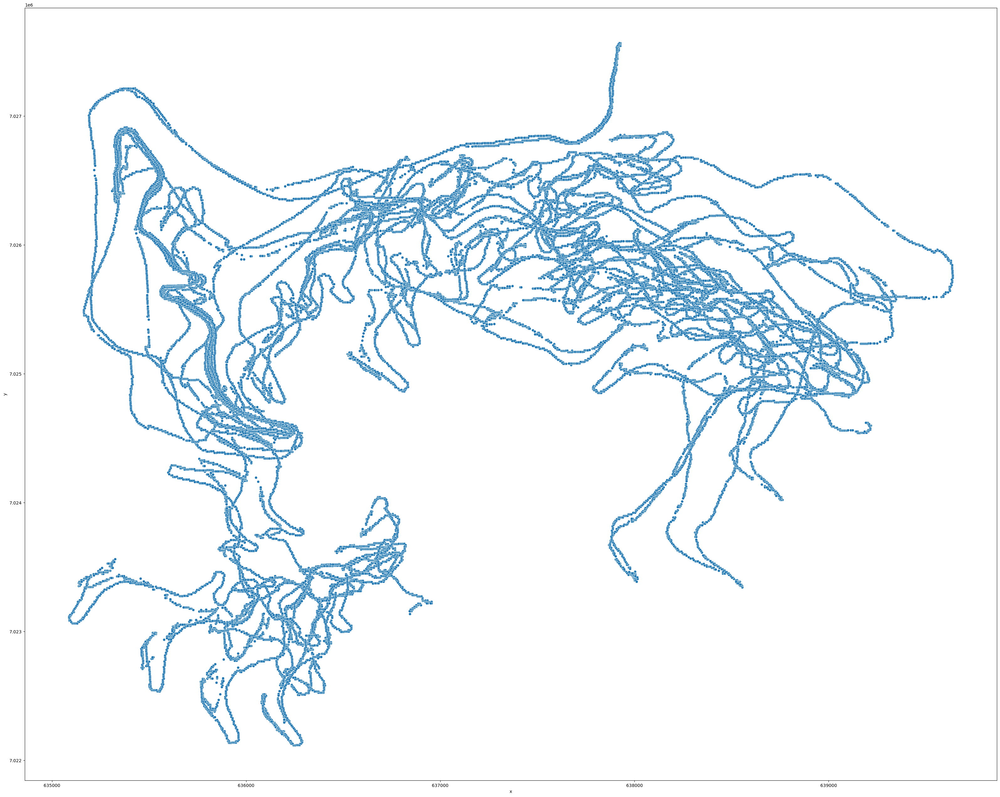

In [23]:
plt.figure(figsize=(40, 32))  
sns.scatterplot(coor, x ='x', y='y' )

## Задание 2

Все пункты делаются на данных, оставшихся после чистки в Задании 1. Правильных ответов (по числам) нет, т к препроцессинг может отличаться. Нам интересно увидеть, как Вы это делаете.
* Вывести средние значения параметров ['hdop', 'speed', 'engine_speed', 'DQ_vertical_bump', 'height'] по самосвалам
* Построить гистограмму суммарных расстояний за каждый рейс.
* Вывести таблицу средних скоростей самосвалов за каждый час суток (формат: колонки - час суток, строки - самосвалы, в ячейках - средняя скорость)
* Выбрать по одному рейсу для каждого самосвала. Для каждого рейса: нарисовать его на общей карте карьера, нарисовать на одном графике кривую изменения скорости от времени и высоты от времени (шкалы должны быть на разных осях).
* Присоединить данные погоды к данным телеметрии

In [25]:
weather = pd.read_parquet(r"C:\Users\Admin\Desktop\weather_hourly.parquet")

In [26]:
for i in telemetry.objectid.unique():
    for j in ['hdop', 'speed', 'engine_speed', 'DQ_vertical_bump', 'height']:
        print(f"mean {j} for object with id{i} - {telemetry[telemetry.objectid==i].loc[:, j].mean()}")

mean hdop for object with id1125 - 8.439589819562274
mean speed for object with id1125 - 13.717950023726576
mean engine_speed for object with id1125 - 1000.6972141526139
mean DQ_vertical_bump for object with id1125 - 0.0
mean height for object with id1125 - 264.878427333017
mean hdop for object with id1124 - 7.0381129848034165
mean speed for object with id1124 - 12.791138991446857
mean engine_speed for object with id1124 - 1135.7244490804505
mean DQ_vertical_bump for object with id1124 - 0.0
mean height for object with id1124 - 266.99026631636207
mean hdop for object with id1126 - 7.584819620143286
mean speed for object with id1126 - 13.430822559924072
mean engine_speed for object with id1126 - 1161.572863740003
mean DQ_vertical_bump for object with id1126 - 0.0
mean height for object with id1126 - 262.75427367738797
mean hdop for object with id1123 - 2.4655178699868547
mean speed for object with id1123 - 16.343266320196435
mean engine_speed for object with id1123 - nan
mean DQ_vertica

In [27]:
sum_dist = []
for i in telemetry.tripid.unique():
    sum_dist_x = (telemetry[telemetry.tripid == i].x.max() - telemetry[telemetry.tripid == i].x.min())
    sum_dist_y = (telemetry[telemetry.tripid == i].y.max() - telemetry[telemetry.tripid == i].y.min())
    sum_dist.append(np.sqrt(sum_dist_x**2 + sum_dist_y**2))

<Axes: ylabel='Count'>

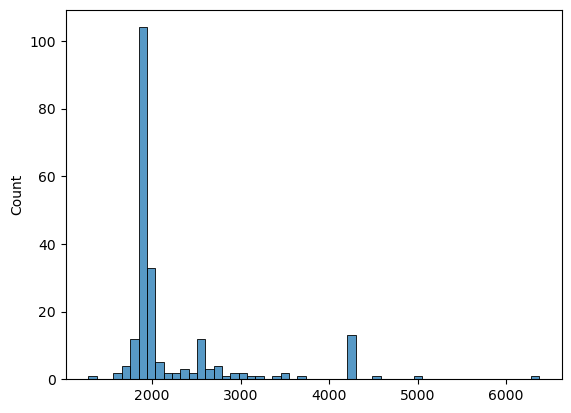

In [28]:
sns.histplot(data=sum_dist)

In [29]:
data = [[i] for i in telemetry.objectid.unique()]
telemetry['hours'] = telemetry.time.dt.hour +telemetry.time.dt.minute / 60 + telemetry.time.dt.second / 3600 

In [30]:
for i in data:
    for j in range(24):
        i.append(telemetry[(telemetry.objectid == i[0]) & (telemetry.hours < j + 1)].speed.mean())

In [31]:
df = pd.DataFrame(data = data).set_index(0).transpose()
df

,1125,1124,1126,1123,1121,1122
1,13.203666,19.360650,17.664315,22.358631,18.466040,NaN
2,15.446244,17.455687,17.876073,20.553895,15.739327,NaN
3,16.276123,17.400750,17.025044,20.844527,13.239571,NaN
4,16.444115,15.697000,15.874585,18.622112,11.568254,NaN
5,16.726804,15.370463,16.175918,19.294494,12.029960,NaN
6,16.490028,14.846484,16.087116,18.610835,11.012764,NaN
7,16.059533,14.766319,15.905555,17.328191,10.516916,NaN
8,15.465661,13.660040,14.752127,16.628029,9.819924,NaN
9,15.208565,13.392114,14.562220,16.584037,9.525958,NaN
10,14.913405,13.268834,14.352699,16.479339,9.725690,NaN


In [32]:
samosval_and_trip = []
for i in telemetry.objectid.unique():
    trips_and_dur = []
    for j in telemetry[(telemetry.objectid == i)].tripid.unique():
        trips_and_dur.append([j, telemetry[telemetry.tripid == j].shape[0]])
    max_dur = (max(i[1] for i in trips_and_dur))
    for ind in range(len(trips_and_dur)):
        if trips_and_dur[ind][1] == max_dur: max_dur_ind = ind
    most_dur_trip = trips_and_dur[max_dur_ind][0]
    samosval_and_trip.append([i, most_dur_trip])
samosval_and_trip

[[1125, 1003732.0],
 [1124, 1003696.0],
 [1126, 1003757.0],
 [1123, 1003656.0],
 [1121, 1003735.0],
 [1122, nan]]

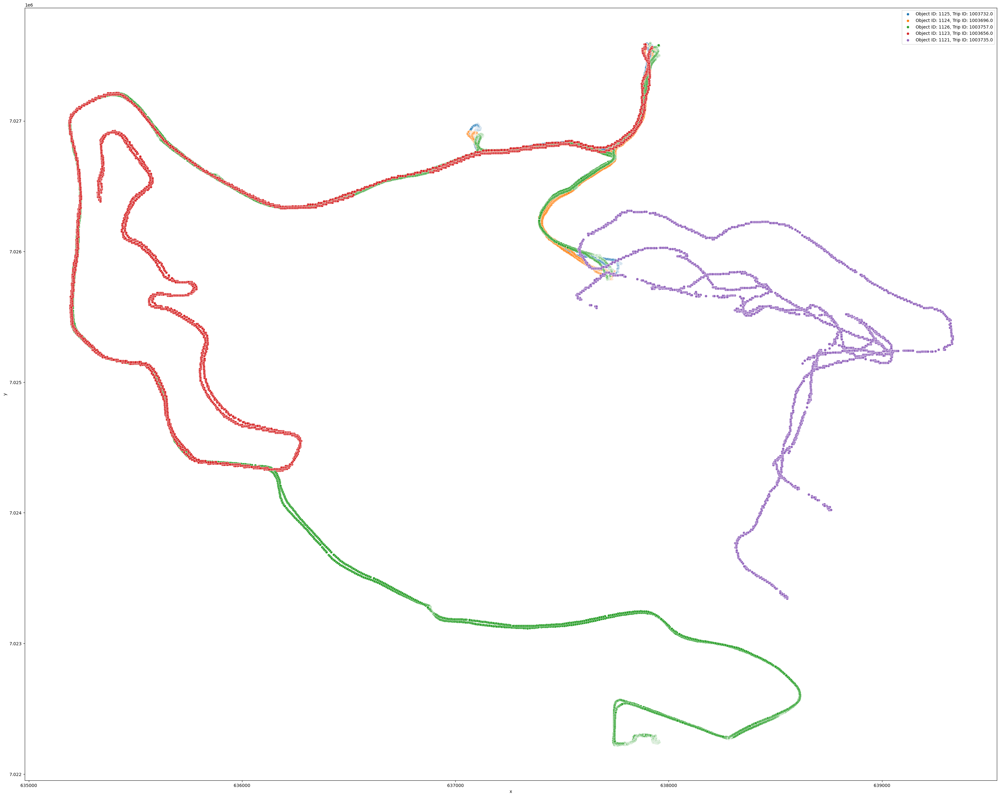

In [33]:
plt.figure(figsize=(40, 32))
for i in samosval_and_trip:
    sns.scatterplot(telemetry[(telemetry.objectid == i[0]) & (telemetry.tripid == i[1])], x = "x", y = "y", label=f'Object ID: {i[0]}, Trip ID: {i[1]}')

<Axes: xlabel='time', ylabel='speed'>

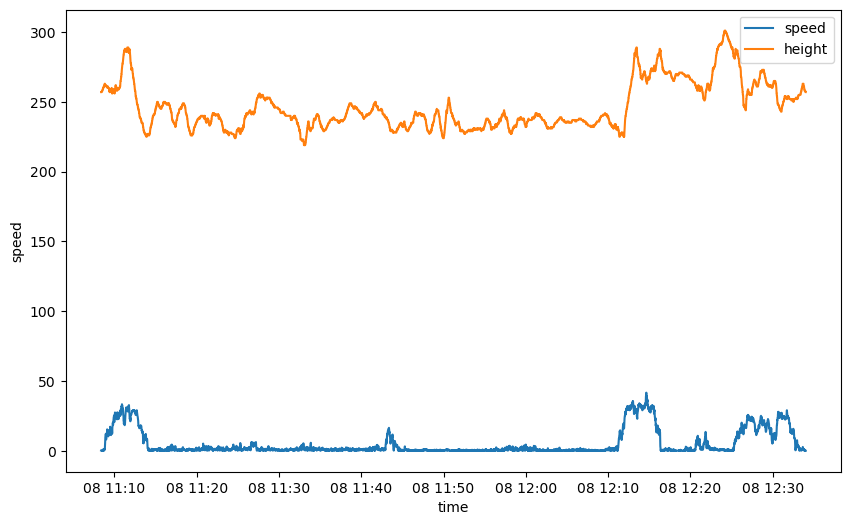

In [34]:
plt.figure(figsize=(10, 6))
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[0][0]) & (telemetry.tripid == samosval_and_trip[0][1])], x = "time", y = "speed", label='speed')
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[0][0]) & (telemetry.tripid == samosval_and_trip[0][1])], x = "time", y = "height", label='height')

<Axes: xlabel='time', ylabel='speed'>

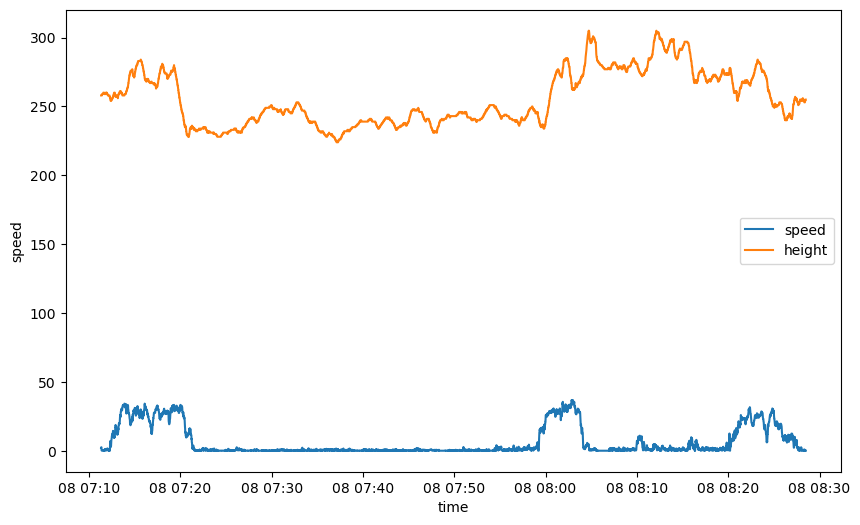

In [35]:
plt.figure(figsize=(10, 6))
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[1][0]) & (telemetry.tripid == samosval_and_trip[1][1])], x = "time", y = "speed", label='speed')
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[1][0]) & (telemetry.tripid == samosval_and_trip[1][1])], x = "time", y = "height", label='height')

<Axes: xlabel='time', ylabel='speed'>

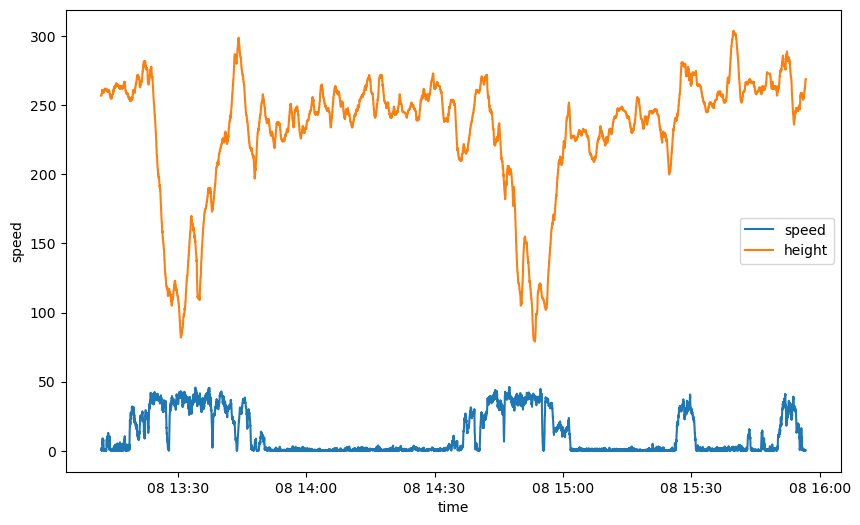

In [36]:
plt.figure(figsize=(10, 6))
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[2][0]) & (telemetry.tripid == samosval_and_trip[2][1])], x = "time", y = "speed", label='speed')
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[2][0]) & (telemetry.tripid == samosval_and_trip[2][1])], x = "time", y = "height", label='height')

<Axes: xlabel='time', ylabel='speed'>

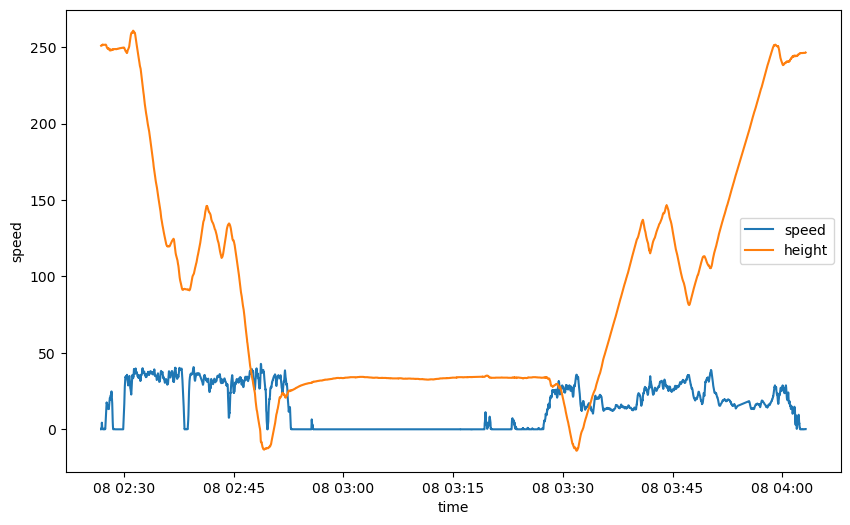

In [37]:
plt.figure(figsize=(10, 6))
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[3][0]) & (telemetry.tripid == samosval_and_trip[3][1])], x = "time", y = "speed", label='speed')
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[3][0]) & (telemetry.tripid == samosval_and_trip[3][1])], x = "time", y = "height", label='height')

<Axes: xlabel='time', ylabel='speed'>

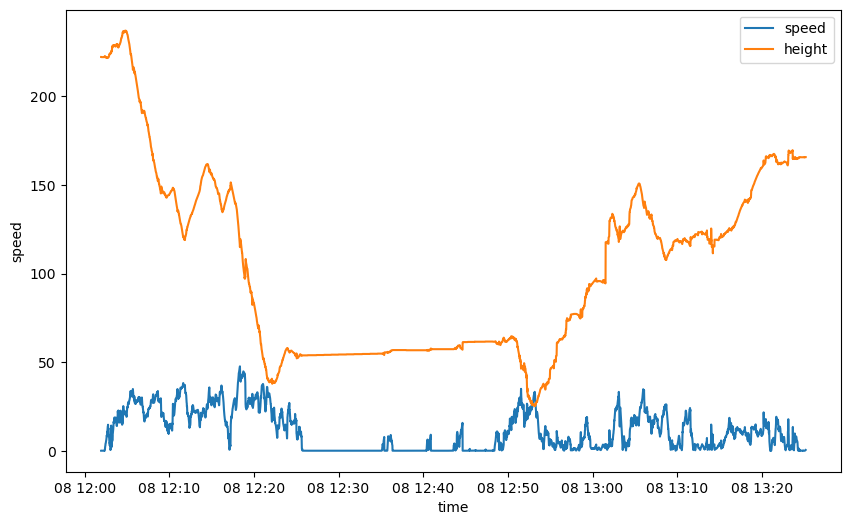

In [38]:
plt.figure(figsize=(10, 6))
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[4][0]) & (telemetry.tripid == samosval_and_trip[4][1])], x = "time", y = "speed", label='speed')
sns.lineplot(telemetry[(telemetry.objectid == samosval_and_trip[4][0]) & (telemetry.tripid == samosval_and_trip[4][1])], x = "time", y = "height", label='height')

In [39]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55 entries, 0 to 54
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   time                 55 non-null     datetime64[us, UTC]
 1   precipIntensity      55 non-null     float64            
 2   precipProbability    55 non-null     float64            
 3   temperature          55 non-null     float64            
 4   apparentTemperature  55 non-null     float64            
 5   dewPoint             55 non-null     float64            
 6   humidity             55 non-null     float64            
 7   pressure             55 non-null     float64            
 8   windSpeed            55 non-null     float64            
 9   windGust             55 non-null     float64            
 10  windBearing          55 non-null     float64            
 11  cloudCover           55 non-null     float64            
 12  visibility           55 

In [40]:
telemetry = telemetry.merge(weather, on = "time")